In [1]:
using Plots
using DSP
using FFTW

In [2]:
# 
# pulse_duration = 0.0005  #seconds
# starting_freq = 350e3     #hz
# ending_freq = 50e3     #hz

# freqs = LinRange(starting_freq, ending_freq, Int(samp_rate * pulse_duration));
# t_pulse = LinRange(0,pulse_duration,Int(samp_rate*pulse_duration));

In [77]:
samp_rate = 2e6  #hz
prf = 10  #Hz
τ = 0.05;
β = 250e3; #Pulse Bandwidth
repetitions = 3;

In [78]:
prt = 1/prf;
t = 0:1/samp_rate:prt;


In [79]:
#Envelope Definition
envelope_type = "Rectangular"

if envelope_type == "Rectangular"
    a = ones(length(t));
    if(length(a) > τ * samp_rate)
        a[Int(τ*samp_rate):end] .= 0;
    end
elseif envelope_type == "Gaussian"
    a = exp.((-t.^2)/(τ^2)) #Gaussian
end


plot(t, a, title="Target Power Envelope")

In [80]:
pulse_type = "Decreasing"

if pulse_type == "Increasing"
    pulse = a.*exp.(im*π*(β/τ)*t.^2)
elseif pulse_type == "Decreasing"
    pulse = a.*exp.(-im*π*β/τ*(t.^2 - 2*τ.*t))
end



#pulse = sin.(2*π*freqs.*t_pulse);

In [81]:
plot(t, abs.(pulse), xguide="Time", yguide="Maginitude", title="Pulse Power Envelope")

In [82]:
plot(t,real(pulse))

In [83]:
plot(LinRange(-samp_rate/2, samp_rate/2, length(pulse)), real(fftshift(fft(pulse))))

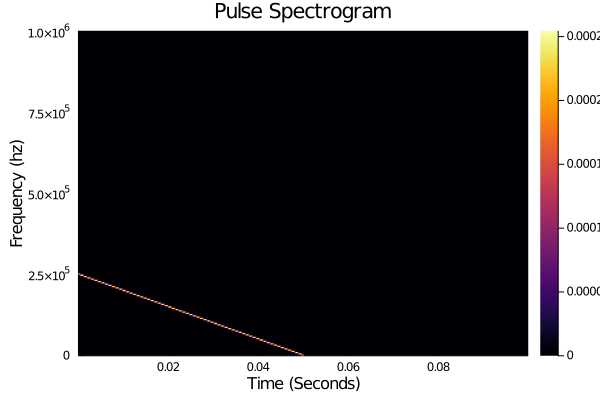

In [84]:
fft_size = 512;
spec = spectrogram((pulse), fft_size; fs=samp_rate);
heatmap(spec.time, LinRange(0,samp_rate/2, Int(fft_size/2)), spec.power[begin:Int(fft_size/2) , :], xguide="Time (Seconds)", yguide="Frequency (hz)", title="Pulse Spectrogram")

In [85]:
Threads.nthreads()

12